# Kernel PCA on the Olivetti Faces Dataset

This notebook explores **Principal Component Analysis (PCA)** and **Kernel PCA** applied to the Olivetti Faces dataset.

We will:
1. Load and explore the dataset
2. Apply **Linear PCA** as a baseline and visualise its eigenfaces
3. **Tune hyperparameters** for each kernel via grid search with cross-validation
4. Apply **Kernel PCA** with several different kernels (RBF, Polynomial, Sigmoid, Cosine) using the tuned parameters
5. Reconstruct and visualise **kernel eigenfaces** for each kernel using the pre-image approximation
6. Use **k-Nearest Neighbours (kNN)** classification after each dimensionality reduction
7. Compare results and visualise the projections

### Background
The Olivetti Faces dataset contains 400 grayscale images of 40 people (10 photos each), each of size 64×64 pixels — giving **4096 features** per image. The photos vary in lighting, expression, and facial details, meaning the data lies on a **nonlinear manifold** that linear PCA cannot fully capture.

## 1. Imports and Setup

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from sklearn.datasets import fetch_olivetti_faces
from sklearn.decomposition import PCA, KernelPCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
import warnings
warnings.filterwarnings('ignore')

# Set random seed for reproducibility
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)

print("All imports successful.")

All imports successful.


## 2. Load and Explore the Dataset

In [2]:
# Load the Olivetti Faces dataset
faces = fetch_olivetti_faces(shuffle=True, random_state=RANDOM_STATE)

X = faces.data    # shape: (400, 4096)
y = faces.target  # shape: (400,) — integers 0..39 indicating person identity

print(f"Dataset shape:      {X.shape}")
print(f"Number of classes:  {len(np.unique(y))} people")
print(f"Samples per class:  {np.bincount(y)[0]}")
print(f"Feature range:      [{X.min():.2f}, {X.max():.2f}]")

Dataset shape:      (400, 4096)
Number of classes:  40 people
Samples per class:  10
Feature range:      [0.00, 1.00]


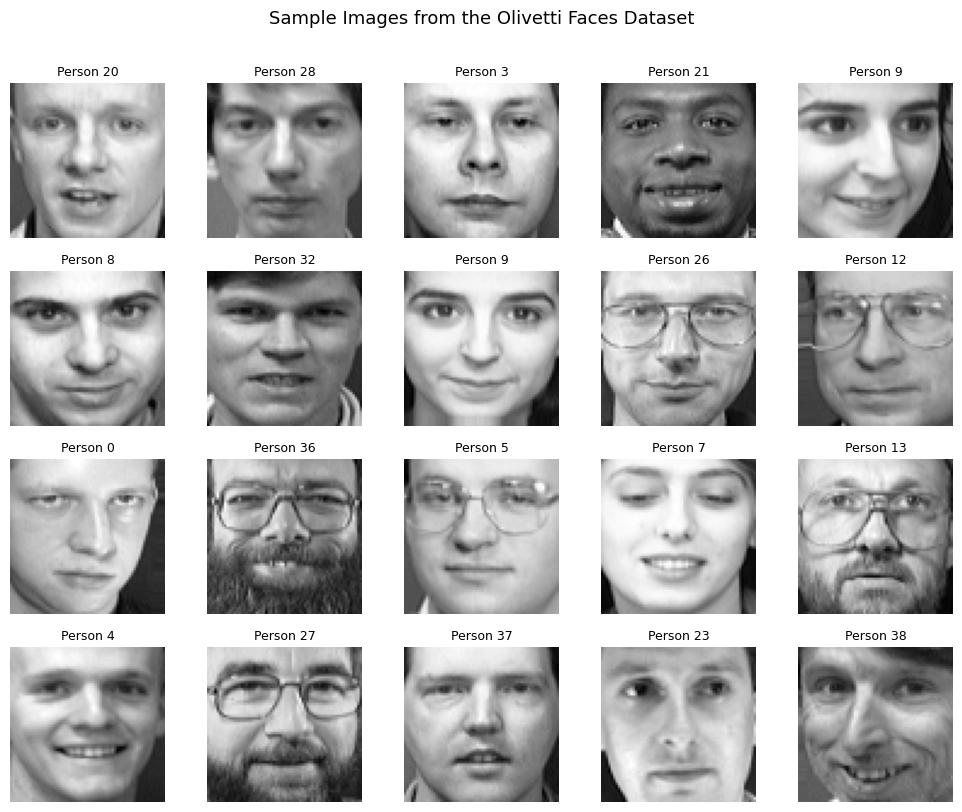

In [3]:
# Visualise a sample of faces (first 20 images)
fig, axes = plt.subplots(4, 5, figsize=(10, 8))
for i, ax in enumerate(axes.flat):
    ax.imshow(faces.images[i], cmap='gray')
    ax.set_title(f'Person {y[i]}', fontsize=9)
    ax.axis('off')
fig.suptitle('Sample Images from the Olivetti Faces Dataset', fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

## 3. Train/Test Split

We split the data into 80% training and 20% test sets, stratifying by person so each set has a balanced number of images per person.

In [4]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=RANDOM_STATE
)

print(f"Training samples: {X_train.shape[0]}")
print(f"Test samples:     {X_test.shape[0]}")

Training samples: 320
Test samples:     80


## 4. Linear PCA (Baseline)

Linear PCA finds directions of **maximum variance** in the original pixel space. These directions are called **eigenfaces**. We reduce from 4096 dimensions down to `n_components`.

**Mathematical idea:** PCA solves for the eigenvectors of the covariance matrix $C = \frac{1}{n} X^T X$, projecting data onto the top $k$ eigenvectors.

In [5]:
N_COMPONENTS = 200# Number of components to keep — you can experiment with this

pca = PCA(n_components=N_COMPONENTS, random_state=RANDOM_STATE)
X_train_pca = pca.fit_transform(X_train)
X_test_pca  = pca.transform(X_test)

explained_var = np.sum(pca.explained_variance_ratio_) * 100
print(f"Variance explained by {N_COMPONENTS} linear PCs: {explained_var:.1f}%")

Variance explained by 200 linear PCs: 98.6%


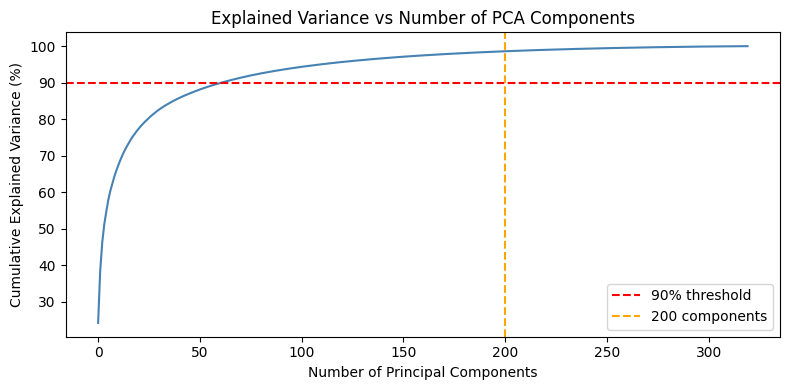

In [6]:
# Plot the explained variance curve
pca_full = PCA(random_state=RANDOM_STATE).fit(X_train)
cumvar = np.cumsum(pca_full.explained_variance_ratio_) * 100

plt.figure(figsize=(8, 4))
plt.plot(cumvar, color='steelblue')
plt.axhline(90, color='red', linestyle='--', label='90% threshold')
plt.axvline(N_COMPONENTS, color='orange', linestyle='--', label=f'{N_COMPONENTS} components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.title('Explained Variance vs Number of PCA Components')
plt.legend()
plt.tight_layout()
plt.show()

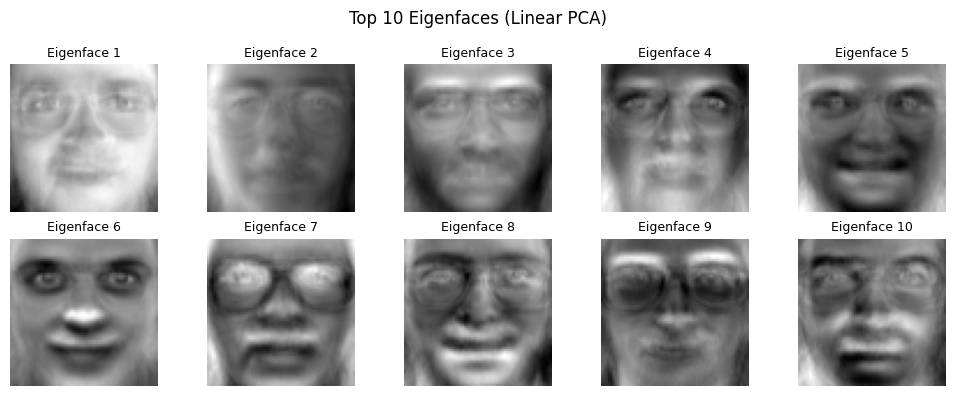

In [7]:
# Visualise the top eigenfaces
fig, axes = plt.subplots(2, 5, figsize=(10, 4))
for i, ax in enumerate(axes.flat):
    ax.imshow(pca.components_[i].reshape(64, 64), cmap='gray')
    ax.set_title(f'Eigenface {i+1}', fontsize=9)
    ax.axis('off')
fig.suptitle('Top 10 Eigenfaces (Linear PCA)', fontsize=12)
plt.tight_layout()
plt.show()

## 6. Hyperparameter Tuning via Grid Search

Rather than guessing kernel parameters, we use **cross-validated grid search** to find the best hyperparameters for each kernel objectively.

### How it works

For each kernel, we build a pipeline:
$$\text{KernelPCA}(\text{params}) \rightarrow \text{kNN classifier}$$

We then search over a grid of hyperparameter values, evaluating each combination using **5-fold cross-validation** on the training set. The combination with the highest mean cross-validation accuracy is selected.

This is a principled alternative to hand-picking values, and means our final kernel comparison is fair — each kernel is given its best possible parameters.

> **Note:** Grid search is computationally expensive (it fits many models). This cell may take several minutes to run.

In [8]:
K_NEIGHBOURS = 5  # Number of neighbours for kNN — you can experiment with this

from sklearn.pipeline import Pipeline

# Grid of hyperparameters to search for each kernel.
# gamma_scale = 1/n_features is sklearn's default heuristic; we search around it.
gamma_scale = 1.0 / X_train.shape[1]   # ≈ 2.4e-4 for 4096 features

kernel_grids = [
    {
        'label': 'RBF',
        'kernel': 'rbf',
        'param_grid': {
            'kpca__gamma': [gamma_scale * f for f in [0.1, 0.5, 1, 2, 5, 10]],
        }
    },
    {
        'label': 'Polynomial',
        'kernel': 'poly',
        'param_grid': {
            'kpca__gamma': [gamma_scale * f for f in [0.5, 1, 2, 5]],
            'kpca__degree': [2, 3, 4],
            'kpca__coef0': [0, 1],
        }
    },
    {
        'label': 'Sigmoid',
        'kernel': 'sigmoid',
        'param_grid': {
            'kpca__gamma': [gamma_scale * f for f in [0.01, 0.1, 0.5, 1]],
            'kpca__coef0': [0, 1],
        }
    },
    {
        'label': 'Cosine',
        'kernel': 'cosine',
        'param_grid': {}   # No hyperparameters to tune
    },
]

best_params = {}   # label -> best hyperparameter dict
best_scores = {}   # label -> best CV accuracy

for cfg in kernel_grids:
    label = cfg['label']
    print(f"Searching: {label}...", end=' ', flush=True)

    pipeline = Pipeline([
        ('kpca', KernelPCA(n_components=N_COMPONENTS, kernel=cfg['kernel'],
                           random_state=RANDOM_STATE)),
        ('knn',  KNeighborsClassifier(n_neighbors=K_NEIGHBOURS)),
    ])

    if cfg['param_grid']:
        search = GridSearchCV(
            pipeline,
            param_grid=cfg['param_grid'],
            cv=5,
            scoring='accuracy',
            n_jobs=-1,
        )
        search.fit(X_train, y_train)
        bp = {k.replace('kpca__', ''): v for k, v in search.best_params_.items()}
        best_params[label] = bp
        best_scores[label] = search.best_score_ * 100
    else:
        # Cosine: no params to tune, just cross-validate as-is
        scores = cross_val_score(pipeline, X_train, y_train, cv=5, scoring='accuracy')
        best_params[label] = {}
        best_scores[label] = scores.mean() * 100

    print(f"done. Best CV accuracy: {best_scores[label]:.1f}%  |  Best params: {best_params[label]}")

print("\nGrid search complete.")

Searching: RBF... done. Best CV accuracy: 76.6%  |  Best params: {'gamma': 2.44140625e-05}
Searching: Polynomial... done. Best CV accuracy: 77.2%  |  Best params: {'coef0': 1, 'degree': 2, 'gamma': 0.0001220703125}
Searching: Sigmoid... done. Best CV accuracy: 79.1%  |  Best params: {'coef0': 1, 'gamma': 0.0001220703125}
Searching: Cosine... done. Best CV accuracy: 73.1%  |  Best params: {}

Grid search complete.


In [9]:
# Print a clean summary of the tuning results
print("=" * 60)
print("GRID SEARCH RESULTS (5-fold CV on training set)")
print("=" * 60)
for label in best_params:
    print(f"\n{label}")
    print(f"  Best CV accuracy : {best_scores[label]:.1f}%")
    if best_params[label]:
        for k, v in best_params[label].items():
            print(f"  {k:<12} = {v}")
    else:
        print("  (no hyperparameters)")
print("=" * 60)

GRID SEARCH RESULTS (5-fold CV on training set)

RBF
  Best CV accuracy : 76.6%
  gamma        = 2.44140625e-05

Polynomial
  Best CV accuracy : 77.2%
  coef0        = 1
  degree       = 2
  gamma        = 0.0001220703125

Sigmoid
  Best CV accuracy : 79.1%
  coef0        = 1
  gamma        = 0.0001220703125

Cosine
  Best CV accuracy : 73.1%
  (no hyperparameters)


## 6b. Kernel PCA — Fitting with Tuned Parameters

We now refit each Kernel PCA using the best parameters found above. These fitted objects are reused throughout the rest of the notebook for eigenface visualisation, classification, and projection plots.

In [10]:
# Build kernel_configs using the tuned parameters
kernel_name_map = {'RBF': 'rbf', 'Polynomial': 'poly', 'Sigmoid': 'sigmoid', 'Cosine': 'cosine'}

kernel_configs = []
for cfg in kernel_grids:
    label_name = cfg['label']
    params = best_params[label_name]
    entry = {
        'kernel': kernel_name_map[label_name],
        'label': label_name + ' (tuned)',
    }
    entry.update(params)
    kernel_configs.append(entry)

kpca_results = {}   # label -> (X_tr, X_te, fitted_kpca_object)

for cfg in kernel_configs:
    kwargs = dict(
        n_components=N_COMPONENTS,
        kernel=cfg['kernel'],
        random_state=RANDOM_STATE,
        fit_inverse_transform=True,
        alpha = 2.0
    )
    for key in ['gamma', 'degree', 'coef0']:
        if key in cfg:
            kwargs[key] = cfg[key]

    kpca = KernelPCA(**kwargs)
    X_tr = kpca.fit_transform(X_train)
    X_te = kpca.transform(X_test)
    kpca_results[cfg['label']] = (X_tr, X_te, kpca)
    print(f"Fitted: {cfg['label']}  → shape: {X_tr.shape}")

Fitted: RBF (tuned)  → shape: (320, 200)
Fitted: Polynomial (tuned)  → shape: (320, 200)
Fitted: Sigmoid (tuned)  → shape: (320, 200)
Fitted: Cosine (tuned)  → shape: (320, 200)


## 7. Classification with k-Nearest Neighbours

After each dimensionality reduction, we train a **k-Nearest Neighbours (kNN)** classifier in the reduced space and evaluate it on the test set. kNN is a good choice here because:
- It has no additional parameters to tune
- It directly measures how well-separated the classes are in the projected space
- It is sensitive to the geometry of the representation

In [11]:
def evaluate_knn(X_tr, X_te, y_tr, y_te, k=K_NEIGHBOURS):
    """Train kNN and return test accuracy."""
    clf = KNeighborsClassifier(n_neighbors=k)
    clf.fit(X_tr, y_tr)
    return clf.score(X_te, y_te) * 100

# Evaluate Linear PCA
acc_pca = evaluate_knn(X_train_pca, X_test_pca, y_train, y_test)
print(f"Linear PCA accuracy:       {acc_pca:.1f}%")

# Evaluate each Kernel PCA
accuracies = {'Linear PCA': acc_pca}
for label, (X_tr, X_te, _) in kpca_results.items():
    acc = evaluate_knn(X_tr, X_te, y_train, y_test)
    accuracies[label] = acc
    print(f"Kernel PCA ({label}) accuracy: {acc:.1f}%")

Linear PCA accuracy:       82.5%
Kernel PCA (RBF (tuned)) accuracy: 82.5%
Kernel PCA (Polynomial (tuned)) accuracy: 83.8%
Kernel PCA (Sigmoid (tuned)) accuracy: 86.2%
Kernel PCA (Cosine (tuned)) accuracy: 86.2%


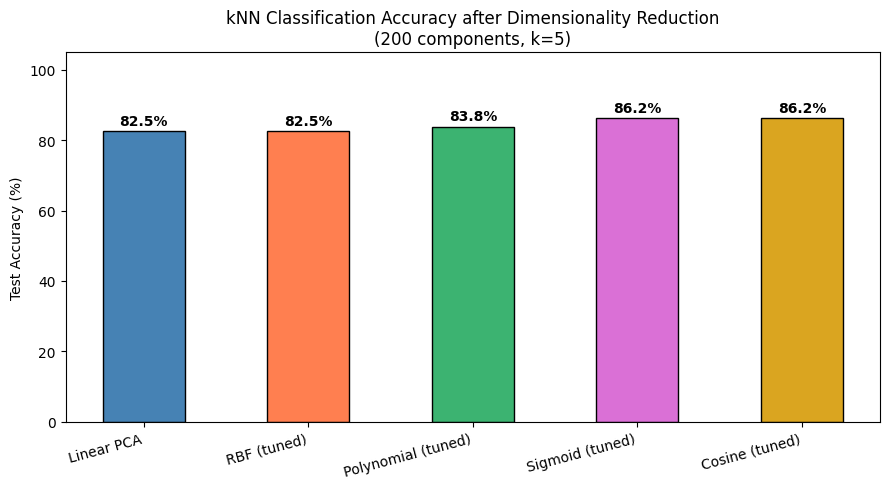

In [12]:
# Bar chart comparison of all methods
labels = list(accuracies.keys())
values = list(accuracies.values())
colours = ['steelblue'] + ['coral', 'mediumseagreen', 'orchid', 'goldenrod']

plt.figure(figsize=(9, 5))
bars = plt.bar(labels, values, color=colours[:len(labels)], edgecolor='black', width=0.5)
plt.ylabel('Test Accuracy (%)')
plt.title(f'kNN Classification Accuracy after Dimensionality Reduction\n({N_COMPONENTS} components, k={K_NEIGHBOURS})')
plt.ylim(0, 105)
for bar, val in zip(bars, values):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
             f'{val:.1f}%', ha='center', va='bottom', fontsize=10, fontweight='bold')
plt.xticks(rotation=15, ha='right')
plt.tight_layout()
plt.show()

## 8. 2D Visualisation of Projections

We now project onto just the **first 2 components** of each method and plot the data coloured by person identity. This shows visually how well each method separates the classes.

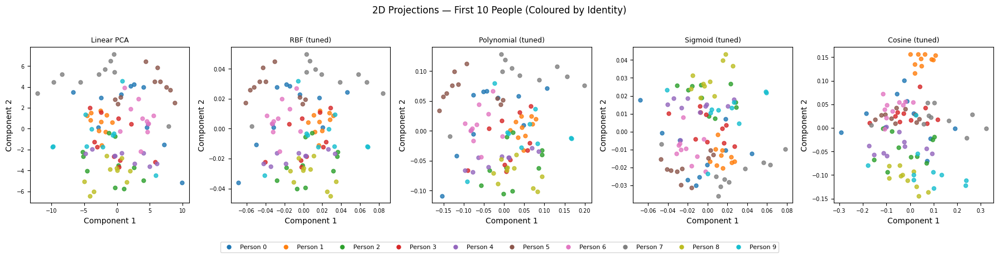

In [13]:
# Choose a subset of people to make the plot readable
PEOPLE_TO_PLOT = list(range(10))  # First 10 people (0–9)
mask = np.isin(y, PEOPLE_TO_PLOT)
X_sub = X[mask]
y_sub = y[mask]

cmap = plt.cm.get_cmap('tab10', len(PEOPLE_TO_PLOT))

all_methods = [('Linear PCA', PCA(n_components=2, random_state=RANDOM_STATE))]
for cfg in kernel_configs:
    kwargs = dict(n_components=2, kernel=cfg['kernel'], random_state=RANDOM_STATE)
    if cfg.get('gamma') is not None:
        kwargs['gamma'] = cfg['gamma']
    if cfg.get('degree') is not None:
        kwargs['degree'] = cfg['degree']
    if cfg.get('coef0') is not None:
        kwargs['coef0'] = cfg['coef0']
    all_methods.append((cfg['label'], KernelPCA(**kwargs)))

fig, axes = plt.subplots(1, 5, figsize=(18, 4))
for ax, (name, model) in zip(axes, all_methods):
    Z = model.fit_transform(X_sub)
    for person in PEOPLE_TO_PLOT:
        idx = y_sub == person
        ax.scatter(Z[idx, 0], Z[idx, 1], s=25, color=cmap(person),
                   label=f'P{person}', alpha=0.8)
    ax.set_title(name, fontsize=9)
    ax.set_xlabel('Component 1')
    ax.set_ylabel('Component 2')
    ax.tick_params(labelsize=7)

handles = [plt.Line2D([0],[0], marker='o', color='w', markerfacecolor=cmap(p),
                       markersize=7, label=f'Person {p}') for p in PEOPLE_TO_PLOT]
fig.legend(handles=handles, loc='lower center', ncol=10, fontsize=8, bbox_to_anchor=(0.5, -0.1))
fig.suptitle('2D Projections — First 10 People (Coloured by Identity)', fontsize=12, y=1.02)
plt.tight_layout()
plt.show()

## 9. Effect of Number of Components

How does accuracy change as we vary the number of components kept? This shows whether kernel PCA gains its advantage quickly or only with many components.

In [14]:
import math
difference = 5
component_range = [difference*i for i in range(1,math.floor(320/difference))]

results_by_n = {'Linear PCA': []}
for cfg in kernel_configs:
    results_by_n[cfg['label']] = []

for n in component_range:
    # Linear PCA
    pca_n = PCA(n_components=n, random_state=RANDOM_STATE)
    acc = evaluate_knn(pca_n.fit_transform(X_train), pca_n.transform(X_test), y_train, y_test)
    results_by_n['Linear PCA'].append(acc)

    # Kernel PCAs
    for cfg in kernel_configs:
        kwargs = dict(n_components=n, kernel=cfg['kernel'], random_state=RANDOM_STATE)
        if cfg.get('gamma') is not None:
            kwargs['gamma'] = cfg['gamma']
        if cfg.get('degree') is not None:
            kwargs['degree'] = cfg['degree']
        if cfg.get('coef0') is not None:
            kwargs['coef0'] = cfg['coef0']
        kpca_n = KernelPCA(**kwargs)
        acc = evaluate_knn(kpca_n.fit_transform(X_train), kpca_n.transform(X_test), y_train, y_test)
        results_by_n[cfg['label']].append(acc)

    print(f"n={n} done")

print("\nAll done!")

n=5 done
n=10 done
n=15 done
n=20 done
n=25 done
n=30 done
n=35 done
n=40 done
n=45 done
n=50 done
n=55 done
n=60 done
n=65 done
n=70 done
n=75 done
n=80 done
n=85 done
n=90 done
n=95 done
n=100 done
n=105 done
n=110 done
n=115 done
n=120 done
n=125 done
n=130 done
n=135 done
n=140 done
n=145 done
n=150 done
n=155 done
n=160 done
n=165 done
n=170 done
n=175 done
n=180 done
n=185 done
n=190 done
n=195 done
n=200 done
n=205 done
n=210 done
n=215 done
n=220 done
n=225 done
n=230 done
n=235 done
n=240 done
n=245 done
n=250 done
n=255 done
n=260 done
n=265 done
n=270 done
n=275 done
n=280 done
n=285 done
n=290 done
n=295 done
n=300 done
n=305 done
n=310 done
n=315 done

All done!


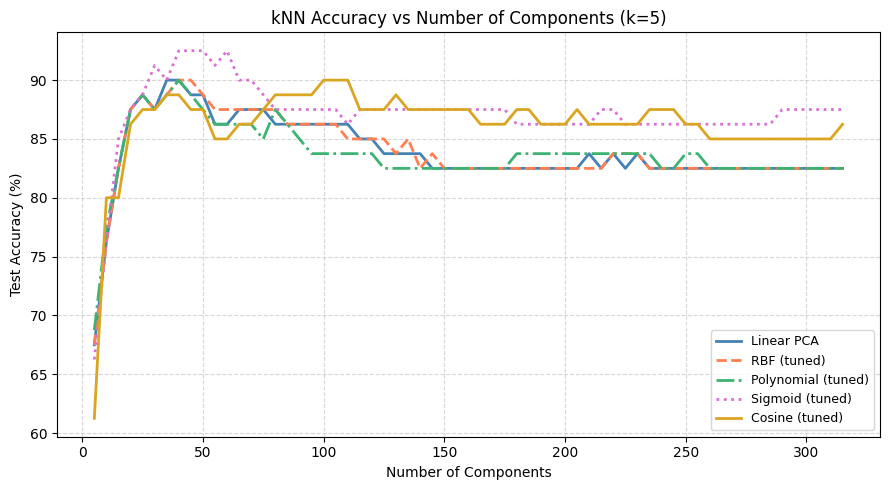

In [15]:
plt.figure(figsize=(9, 5))
line_styles = ['-o', '--s', '-.^', ':D', '-*']
method_colours = ['steelblue', 'coral', 'mediumseagreen', 'orchid', 'goldenrod']

for (name, accs), ls, col in zip(results_by_n.items(), line_styles, method_colours):
    plt.plot(component_range, accs, ls, label=name, color=col, linewidth=2, markersize=7,marker ="")

plt.xlabel('Number of Components')
plt.ylabel('Test Accuracy (%)')
plt.title(f'kNN Accuracy vs Number of Components (k={K_NEIGHBOURS})')
plt.legend(fontsize=9)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

## 10. Effect of the RBF Kernel Bandwidth (γ)

The RBF kernel $k(x, x') = \exp(-\gamma \|x - x'\|^2)$ has a key hyperparameter $\gamma$:
- **Large γ** → kernel decays quickly → only very similar images are considered neighbours → can overfit
- **Small γ** → kernel decays slowly → all images look similar → loses discriminative power

The grid search in section 6 already identified a good γ. This sweep visualises the full accuracy curve across a wider range of values, confirming that the tuned γ sits near the peak and showing what happens at the extremes.

γ = 1e-05  →  accuracy = 82.5%
γ = 5e-05  →  accuracy = 82.5%
γ = 1e-04  →  accuracy = 82.5%
γ = 5e-04  →  accuracy = 82.5%
γ = 1e-03  →  accuracy = 82.5%
γ = 5e-03  →  accuracy = 83.8%
γ = 1e-02  →  accuracy = 85.0%
γ = 5e-02  →  accuracy = 61.3%


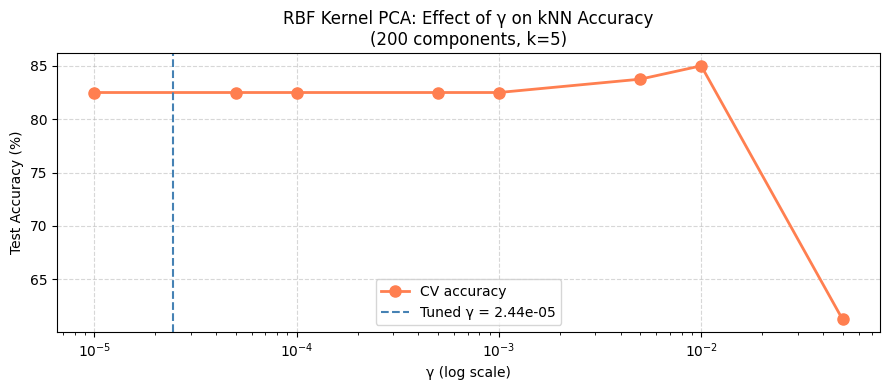

In [16]:
gamma_values = [1e-5, 5e-5, 1e-4, 5e-4, 1e-3, 5e-3, 1e-2, 5e-2]
gamma_accs = []

for g in gamma_values:
    kpca_g = KernelPCA(n_components=N_COMPONENTS, kernel='rbf', gamma=g, random_state=RANDOM_STATE)
    acc = evaluate_knn(kpca_g.fit_transform(X_train), kpca_g.transform(X_test), y_train, y_test)
    gamma_accs.append(acc)
    print(f"γ = {g:.0e}  →  accuracy = {acc:.1f}%")

# Retrieve the tuned gamma from the grid search results
tuned_gamma = best_params.get('RBF', {}).get('gamma', None)

plt.figure(figsize=(9, 4))
plt.semilogx(gamma_values, gamma_accs, '-o', color='coral', linewidth=2, markersize=8, label='CV accuracy')
if tuned_gamma is not None:
    plt.axvline(tuned_gamma, color='steelblue', linestyle='--', linewidth=1.5,
                label=f'Tuned γ = {tuned_gamma:.2e}')
plt.xlabel('γ (log scale)')
plt.ylabel('Test Accuracy (%)')
plt.title(f'RBF Kernel PCA: Effect of γ on kNN Accuracy\n({N_COMPONENTS} components, k={K_NEIGHBOURS})')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

## 11. Summary

Run the cell below to print a clean summary of all results.

In [17]:
print("=" * 50)
print("SUMMARY: kNN Test Accuracy by Method")
print(f"(n_components={N_COMPONENTS}, k={K_NEIGHBOURS})")
print("=" * 50)
sorted_accs = sorted(accuracies.items(), key=lambda x: x[1], reverse=True)
for rank, (name, acc) in enumerate(sorted_accs, 1):
    print(f"{rank}. {name:<30} {acc:.1f}%")
print("=" * 50)

SUMMARY: kNN Test Accuracy by Method
(n_components=200, k=5)
1. Sigmoid (tuned)                86.2%
2. Cosine (tuned)                 86.2%
3. Polynomial (tuned)             83.8%
4. Linear PCA                     82.5%
5. RBF (tuned)                    82.5%


## Discussion Questions

Use the results from this notebook to answer the following in your report:

1. **Why does Kernel PCA outperform linear PCA on this dataset?** Think about the geometry of face images under varying lighting and expression.

2. **Why does the RBF kernel perform better than the Sigmoid kernel?** What does the Sigmoid kernel's formula tell you about what it measures?

3. **What is the effect of γ on the RBF kernel?** Is there a clear optimal value? What happens at the extremes?

4. **How many components do you need before accuracy plateaus?** Does kernel PCA reach a good accuracy faster than linear PCA?

5. **What are the limitations of Kernel PCA?** (Hint: think about computational cost — what is the size of the kernel matrix, and how does this scale with the number of training samples?)

6. **What does the grid search tell you about the sensitivity of each kernel to its hyperparameters?** Which kernel was most sensitive to its parameter choices? Does the tuned RBF γ match the standard heuristic $\gamma = 1/d$ where $d$ is the number of features?

## 12. Reconstruction Error

A natural way to compare kernels visually is to ask: if we project a test image into the reduced space and then reconstruct it, how much information is lost?

For **linear PCA**, reconstruction is exact in the limit of all components:
$$\hat{x} = \mu + \sum_{i=1}^{k} z_i v_i$$
where $v_i$ are the eigenvectors and $z_i$ the projected coordinates. With few components, the reconstruction is blurry because we are discarding directions of variance.

For **Kernel PCA**, reconstruction uses the `inverse_transform` approximation (kernel ridge regression). Unlike when we used it for eigenfaces, applying it to *actual data points* is a legitimate use — we are asking it to invert a real projection rather than a synthetic basis vector, so the result is much more meaningful.

We compare reconstructions across a range of component counts to show how quickly each method recovers the original image, and compute the **mean squared error (MSE)** between original and reconstruction as a quantitative measure.

In [18]:
# Choose a few test images to reconstruct — pick one per person for variety
N_EXAMPLES = 5
example_idx = [np.where(y_test == p)[0][0] for p in range(N_EXAMPLES)]
X_examples  = X_test[example_idx]
y_examples  = y_test[example_idx]

# Component counts to compare
# recon_components = [5, 20, 40, 60]
recon_components = [5*i for i in range(1,21)]

# Kernels to show: linear PCA + tuned kernel PCAs
recon_methods = [('Linear PCA', 'linear')] + [
    (label, cfg['kernel'])
    for label, cfg in zip(
        [c['label'] for c in kernel_configs],
        kernel_configs
    )
]

print("Methods:", [m[0] for m in recon_methods])

Methods: ['Linear PCA', 'RBF (tuned)', 'Polynomial (tuned)', 'Sigmoid (tuned)', 'Cosine (tuned)']


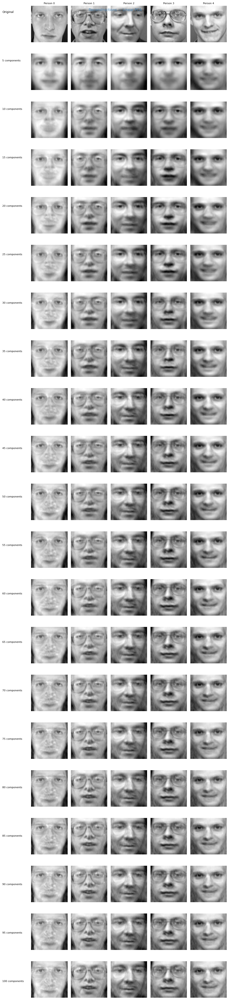

Done: Linear PCA


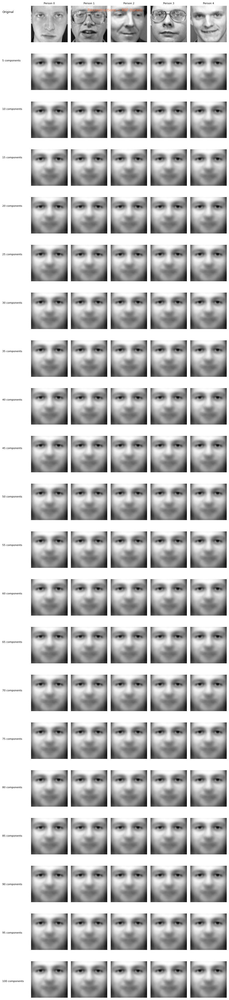

Done: RBF (tuned)


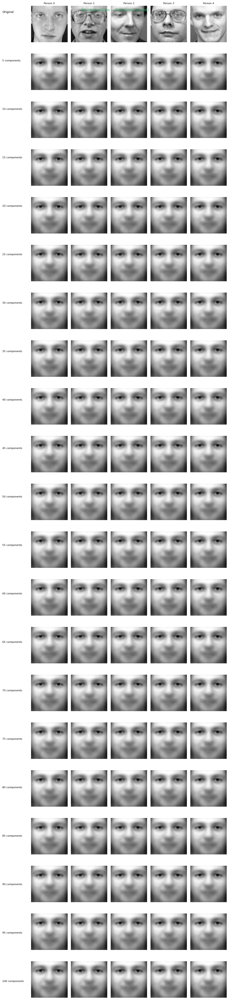

Done: Polynomial (tuned)


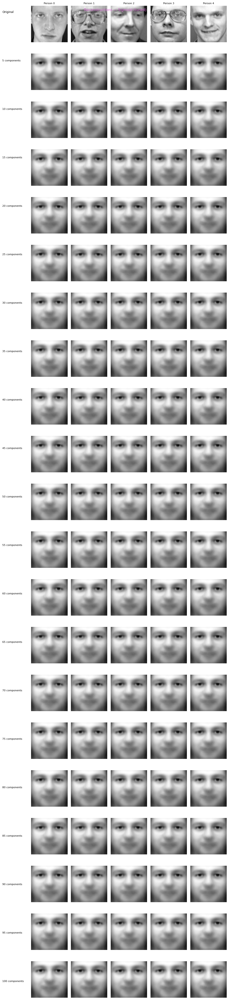

Done: Sigmoid (tuned)


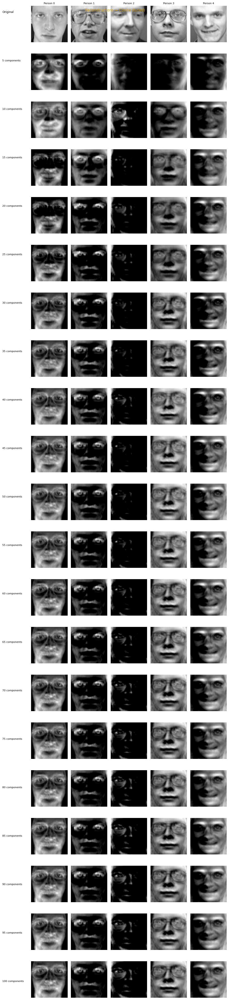

Done: Cosine (tuned)


In [19]:
def reconstruct_linear_pca(X_train, X_examples, n_comp):
    """Reconstruct using linear PCA with n_comp components."""
    p = PCA(n_components=n_comp, random_state=RANDOM_STATE)
    p.fit(X_train)
    Z = p.transform(X_examples)
    return p.inverse_transform(Z)

def reconstruct_kernel_pca(X_train, X_examples, cfg, n_comp):
    """Reconstruct using kernel PCA with n_comp components."""
    kwargs = dict(
        n_components=n_comp,
        kernel=cfg['kernel'],
        fit_inverse_transform=True,
        random_state=RANDOM_STATE,
        alpha = 2
    )
    for key in ['gamma', 'degree', 'coef0']:
        if key in cfg:
            kwargs[key] = cfg[key]
    kp = KernelPCA(**kwargs)
    kp.fit(X_train)
    Z = kp.transform(X_examples)
    return kp.inverse_transform(Z)

# Grid: rows = (original + one row per n_comp), cols = examples
# We'll do one figure per method so it stays readable
method_colours = ['steelblue', 'coral', 'mediumseagreen', 'orchid', 'goldenrod']

for (method_name, kernel_type), col in zip(recon_methods, method_colours):
    n_rows = 1 + len(recon_components)   # original + one row per component count
    fig, axes = plt.subplots(n_rows, N_EXAMPLES, figsize=(N_EXAMPLES * 2, n_rows * 2.1))

    # Row 0: original images
    for col_idx in range(N_EXAMPLES):
        axes[0, col_idx].imshow(X_examples[col_idx].reshape(64, 64), cmap='gray')
        axes[0, col_idx].set_title(f'Person {y_examples[col_idx]}', fontsize=8)
        axes[0, col_idx].axis('off')
    fig.text(0.01, 1 - 0.5/n_rows, 'Original', fontsize=9, va='center', ha='left')

    # Remaining rows: reconstructions at each component count
    for row_idx, n_comp in enumerate(recon_components, start=1):
        if kernel_type == 'linear':
            recons = reconstruct_linear_pca(X_train, X_examples, n_comp)
        else:
            cfg = next(c for c in kernel_configs if c['kernel'] == kernel_type)
            recons = reconstruct_kernel_pca(X_train, X_examples, cfg, n_comp)

        mse = np.mean((X_examples - recons) ** 2)

        for col_idx in range(N_EXAMPLES):
            img = recons[col_idx].reshape(64, 64)
            img = np.clip(img, 0, 1)
            axes[row_idx, col_idx].imshow(img, cmap='gray')
            axes[row_idx, col_idx].axis('off')
        fig.text(0.01, 1 - (row_idx + 0.5)/n_rows, f'{n_comp} components',
        fontsize=8, va='center', ha='left')

    fig.suptitle(f'Reconstructions — {method_name}', fontsize=11, color=col)
    plt.tight_layout(rect=[0.12, 0, 1, 1])
    plt.show()
    print(f"Done: {method_name}")

Computing MSE curve: Linear PCA... done
Computing MSE curve: RBF (tuned)... done
Computing MSE curve: Polynomial (tuned)... done
Computing MSE curve: Sigmoid (tuned)... done
Computing MSE curve: Cosine (tuned)... done


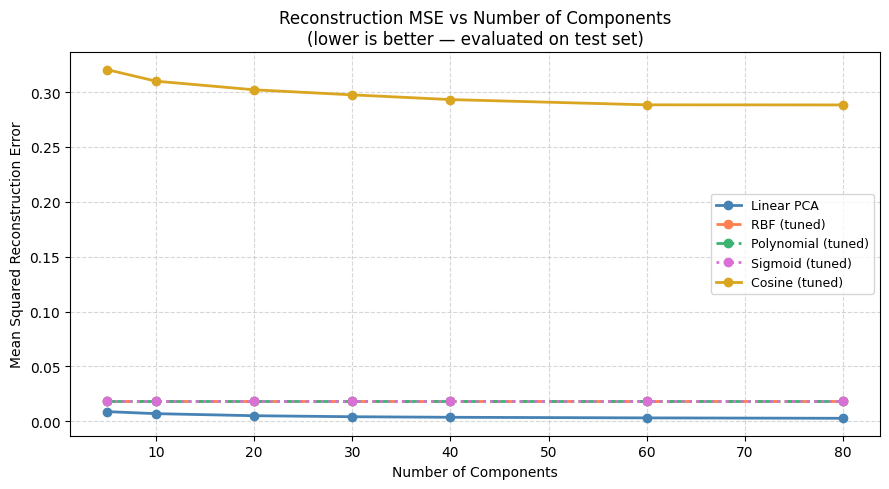

In [20]:
# Quantitative comparison: MSE vs number of components for each method
# This is the cleaner single-figure summary for your report

mse_component_range = [5, 10, 20, 30, 40, 60, 80]
mse_results = {method_name: [] for method_name, _ in recon_methods}

for method_name, kernel_type in recon_methods:
    print(f"Computing MSE curve: {method_name}...", end=' ', flush=True)
    for n_comp in mse_component_range:
        if kernel_type == 'linear':
            recons = reconstruct_linear_pca(X_train, X_test, n_comp)
        else:
            cfg = next(c for c in kernel_configs if c['kernel'] == kernel_type)
            recons = reconstruct_kernel_pca(X_train, X_test, cfg, n_comp)
        mse = np.mean((X_test - recons) ** 2)
        mse_results[method_name].append(mse)
    print("done")

# Plot
plt.figure(figsize=(9, 5))
line_styles = ['-', '--', '-.', ':', '-']
for (method_name, _), ls, col in zip(recon_methods, line_styles, method_colours):
    plt.plot(mse_component_range, mse_results[method_name],
             ls, label=method_name, color=col, linewidth=2, marker='o', markersize=6)

plt.xlabel('Number of Components')
plt.ylabel('Mean Squared Reconstruction Error')
plt.title('Reconstruction MSE vs Number of Components\n'
          '(lower is better — evaluated on test set)')
plt.legend(fontsize=9)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

## 12b. Effect of Alpha (Regularisation) on Kernel Reconstruction

When `fit_inverse_transform=True`, Kernel PCA uses **kernel ridge regression** to approximate the pre-image (inverse transform). The `alpha` parameter controls the regularisation strength:

- **Large α** → stronger regularisation → smoother but potentially blurrier reconstructions
- **Small α** → weaker regularisation → fits training data more closely, may overfit

We sweep `alpha` over a log-spaced grid from `1e-5` to `100` and measure reconstruction MSE on the test set for each kernel.

Sweeping alpha: RBF (tuned)... done
Sweeping alpha: Polynomial (tuned)... done
Sweeping alpha: Sigmoid (tuned)... done
Sweeping alpha: Cosine (tuned)... done


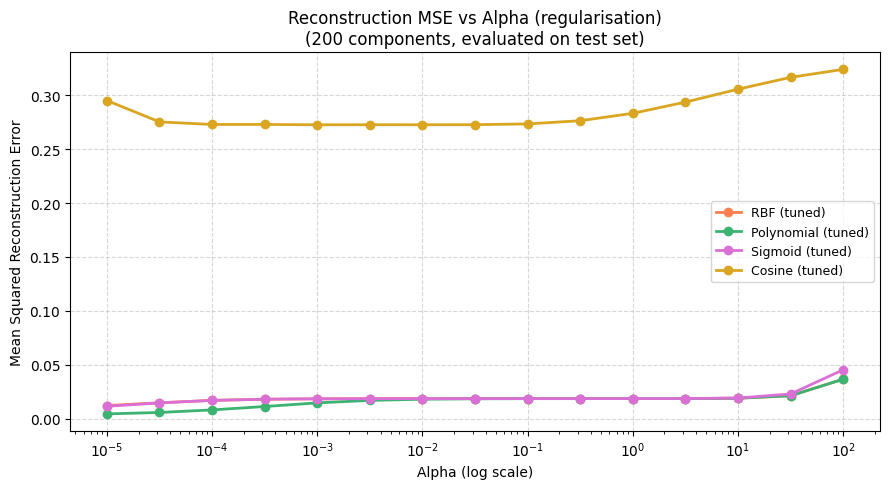


Best alpha per kernel (lowest reconstruction MSE):
  RBF (tuned)               alpha = 1.00e-05  MSE = 0.012275
  Polynomial (tuned)        alpha = 1.00e-05  MSE = 0.004551
  Sigmoid (tuned)           alpha = 1.00e-05  MSE = 0.011606
  Cosine (tuned)            alpha = 1.00e-03  MSE = 0.272556


In [21]:
import numpy as np
alpha_values = np.logspace(-5, 2, 15)  # 1e-5 to 100, log-spaced

def reconstruct_kpca_alpha(X_train, X_examples, cfg, n_comp, alpha):
    """Reconstruct using KernelPCA with a specific alpha regularisation."""
    kwargs = dict(
        n_components=n_comp,
        kernel=cfg['kernel'],
        fit_inverse_transform=True,
        alpha=alpha,
        random_state=RANDOM_STATE,
    )
    for key in ['gamma', 'degree', 'coef0']:
        if key in cfg:
            kwargs[key] = cfg[key]
    kp = KernelPCA(**kwargs)
    kp.fit(X_train)
    Z = kp.transform(X_examples)
    return kp.inverse_transform(Z)

# Sweep alpha for each kernel at N_COMPONENTS, measure MSE on test set
alpha_mse_results = {cfg['label']: [] for cfg in kernel_configs}

for cfg in kernel_configs:
    print(f"Sweeping alpha: {cfg['label']}...", end=' ', flush=True)
    for alpha in alpha_values:
        recons = reconstruct_kpca_alpha(X_train, X_test, cfg, N_COMPONENTS, alpha)
        mse = np.mean((X_test - recons) ** 2)
        alpha_mse_results[cfg['label']].append(mse)
    print('done')

# Plot MSE vs alpha for all kernels
plt.figure(figsize=(9, 5))
for (label, mses), col in zip(alpha_mse_results.items(), method_colours[1:]):
    plt.semilogx(alpha_values, mses, '-o', label=label, color=col, linewidth=2, markersize=6)

plt.xlabel('Alpha (log scale)')
plt.ylabel('Mean Squared Reconstruction Error')
plt.title(f'Reconstruction MSE vs Alpha (regularisation)\n'
          f'({N_COMPONENTS} components, evaluated on test set)')
plt.legend(fontsize=9)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

# Print best alpha per kernel
print('\nBest alpha per kernel (lowest reconstruction MSE):')
for label, mses in alpha_mse_results.items():
    best_idx = np.argmin(mses)
    print(f'  {label:<25} alpha = {alpha_values[best_idx]:.2e}  MSE = {mses[best_idx]:.6f}')

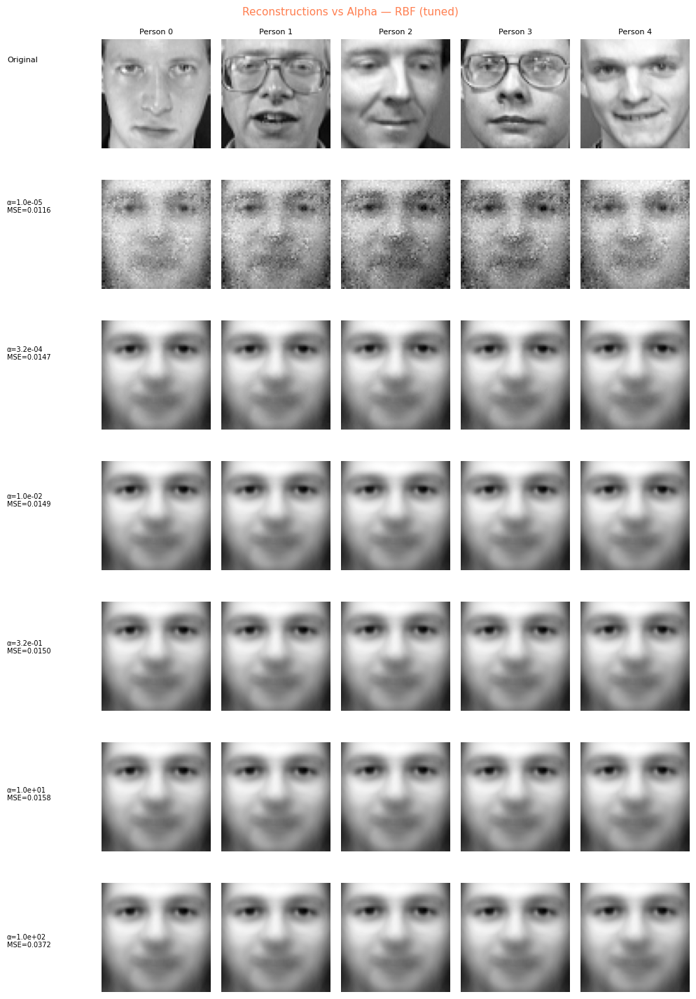

Done: RBF (tuned)


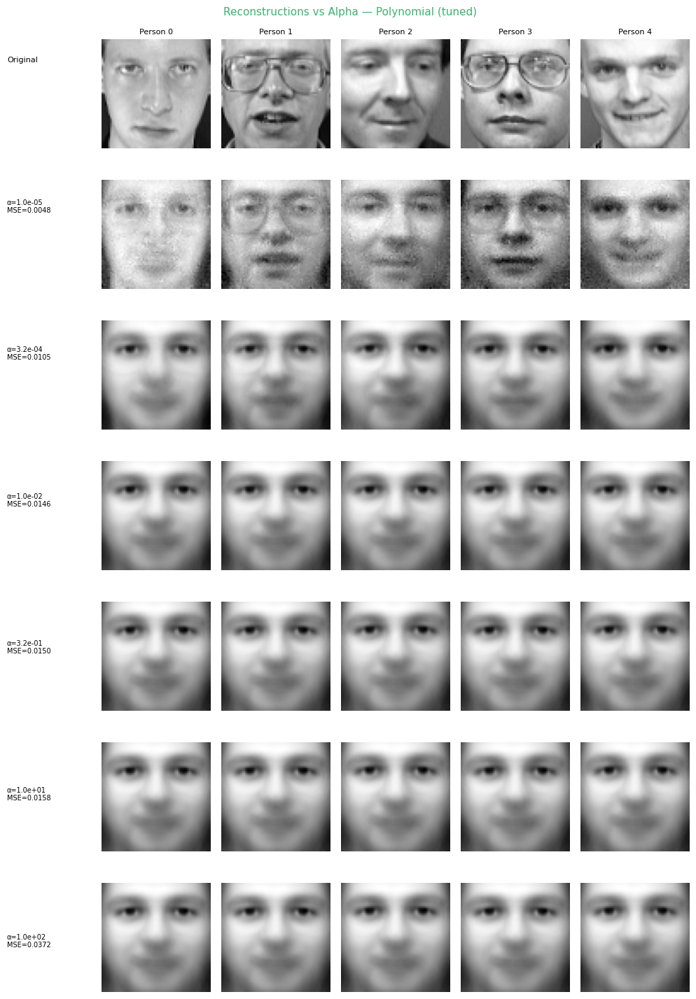

Done: Polynomial (tuned)


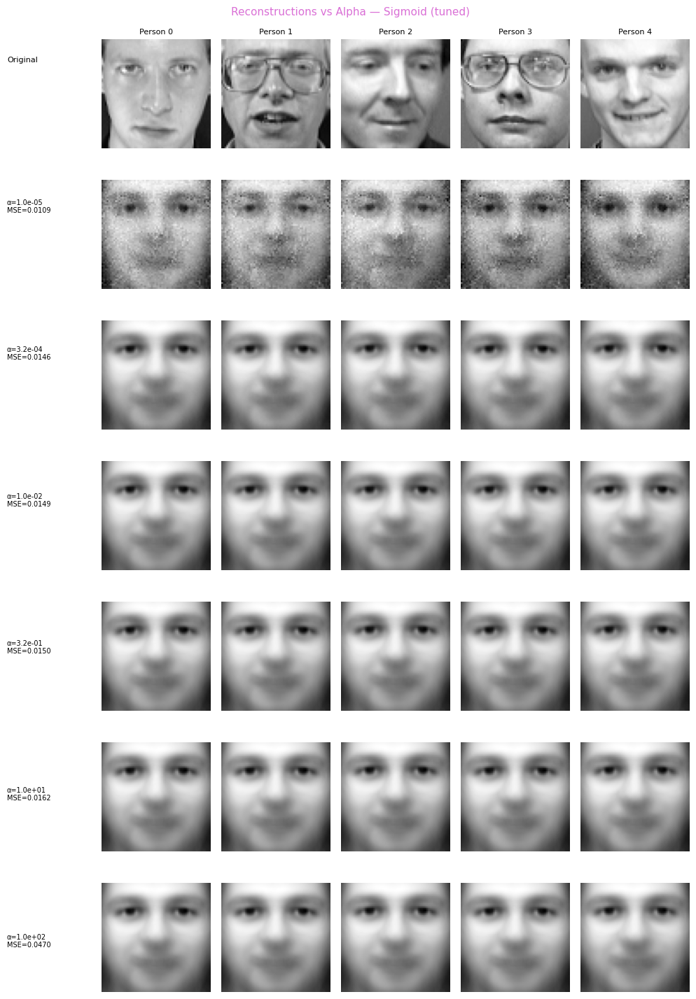

Done: Sigmoid (tuned)


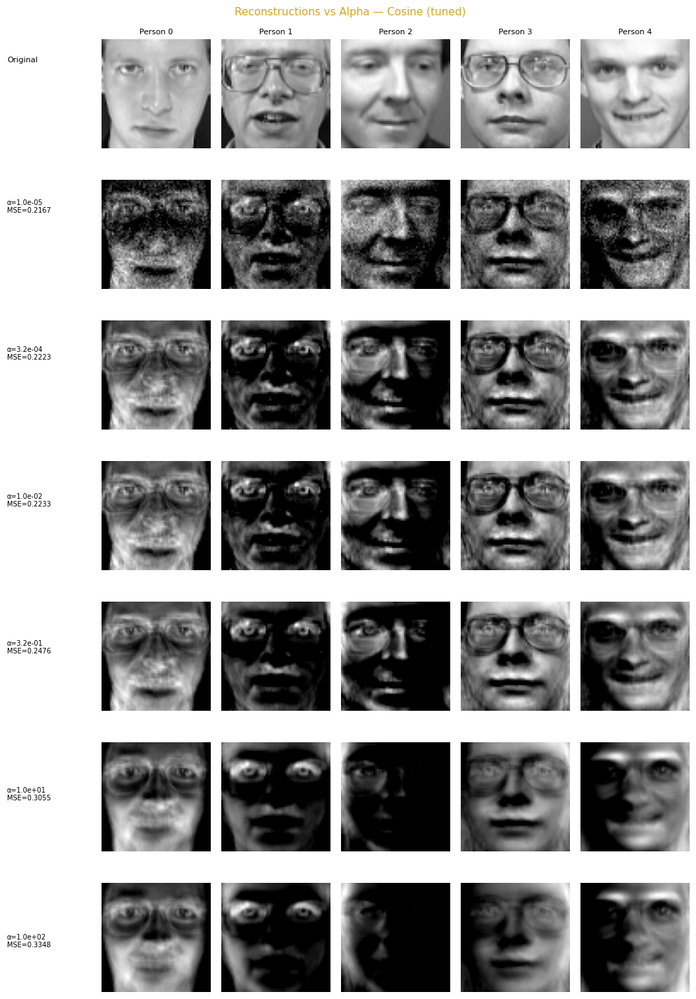

Done: Cosine (tuned)


In [22]:
# Visual reconstruction grid: rows = selected alpha values, cols = example faces
# One figure per kernel so detail is preserved

# Pick a subset of alpha values evenly spread across the log range for display
alpha_display_idx = [0, 3, 6, 9, 12, 14]  # indices into alpha_values (6 levels)
alpha_display = alpha_values[alpha_display_idx]

for cfg, col in zip(kernel_configs, method_colours[1:]):
    n_rows = 1 + len(alpha_display)  # original + one row per alpha
    fig, axes = plt.subplots(n_rows, N_EXAMPLES, figsize=(N_EXAMPLES * 2, n_rows * 2.1))

    # Row 0: original images
    for col_idx in range(N_EXAMPLES):
        axes[0, col_idx].imshow(X_examples[col_idx].reshape(64, 64), cmap='gray')
        axes[0, col_idx].set_title(f'Person {y_examples[col_idx]}', fontsize=8)
        axes[0, col_idx].axis('off')
    fig.text(0.01, 1 - 0.5 / n_rows, 'Original', fontsize=8, va='center', ha='left', color='black')

    # Remaining rows: reconstructions at each alpha
    for row_idx, alpha in enumerate(alpha_display, start=1):
        recons = reconstruct_kpca_alpha(X_train, X_examples, cfg, N_COMPONENTS, alpha)
        mse = np.mean((X_examples - recons) ** 2)
        for col_idx in range(N_EXAMPLES):
            img = np.clip(recons[col_idx].reshape(64, 64), 0, 1)
            axes[row_idx, col_idx].imshow(img, cmap='gray')
            axes[row_idx, col_idx].axis('off')
        fig.text(
            0.01, 1 - (row_idx + 0.5) / n_rows,
            f'α={alpha:.1e}\nMSE={mse:.4f}', fontsize=7, va='center', ha='left'
        )

    fig.suptitle(f'Reconstructions vs Alpha — {cfg["label"]}', fontsize=11, color=col)
    plt.tight_layout(rect=[0.13, 0, 1, 1])
    plt.show()
    print(f'Done: {cfg["label"]}')


## 12c. Sweeping the Inverse-Kernel Hyperparameters (γ₂ and α)

When `fit_inverse_transform=True`, sklearn's `KernelPCA` fits a **Kernel Ridge Regression** (KRR) internally to approximate the pre-image, but it (a) reuses the same kernel and `gamma` as the forward KPCA, and (b) ties the regularisation to a single `alpha`. Neither choice is necessarily good for reconstruction.

Here we decouple the inverse map completely. We keep the **RBF kernel as the inverse kernel** and fit a `KernelRidge` manually:

1. Fit `KernelPCA` on training data and project: `Z_train = kpca.fit_transform(X_train)` *(already done in section 6b — we reuse `kpca_results`)*
2. Fit `KernelRidge(kernel='rbf', alpha=α, gamma=γ₂)` mapping `Z_train → X_train`
3. Reconstruct: project new data with `kpca.transform`, then call `krr.predict`

The two hyperparameters of the inverse map:
- **γ₂** — bandwidth of the inverse RBF kernel, measured in the *projected* space $Z$ (so its natural scale is unrelated to the forward γ, which lives in pixel space)
- **α** — weight decay (ridge regularisation) of the KRR. Large α → smoother, blurrier pre-images; tiny α → interpolates the training projections, can become ill-conditioned

We sweep a full **2D log-spaced grid over (α, γ₂)** and evaluate reconstruction MSE on the test set. Because the forward KPCA is fitted once and only the KRR is refitted at each grid point, the full 15×15 sweep over all four kernels takes well under a minute.

In [23]:
from sklearn.kernel_ridge import KernelRidge

# 2D sweep over the inverse-kernel hyperparameters.
# Forward KPCA projections are reused from section 6b (kpca_results) —
# only the RBF KernelRidge inverse map is refitted at each grid point.
alpha_grid  = np.logspace(-5, 2, 15)   # weight decay of the inverse map
gamma2_grid = np.logspace(-5, 2, 15)   # bandwidth of the inverse RBF kernel (in Z-space)

def fit_inverse_krr(Z_train, alpha, gamma2):
    """RBF KRR inverse map Z_train -> X_train."""
    krr = KernelRidge(kernel='rbf', alpha=alpha, gamma=gamma2)
    krr.fit(Z_train, X_train)
    return krr

inv_sweep = {}   # label -> MSE matrix, shape (len(alpha_grid), len(gamma2_grid))

for label, (Z_tr, Z_te, _) in kpca_results.items():
    print(f'Sweeping inverse kernel for {label}...', end=' ', flush=True)
    M = np.zeros((len(alpha_grid), len(gamma2_grid)))
    for i, a in enumerate(alpha_grid):
        for j, g2 in enumerate(gamma2_grid):
            krr = fit_inverse_krr(Z_tr, a, g2)
            M[i, j] = np.mean((krr.predict(Z_te) - X_test) ** 2)
    inv_sweep[label] = M
    print('done')

# Summary: best (alpha, gamma2) per forward kernel vs the built-in inverse_transform
print('\nBest inverse-kernel parameters per forward kernel (test-set MSE):')
inv_best = {}
for label, M in inv_sweep.items():
    bi, bj = np.unravel_index(np.argmin(M), M.shape)
    inv_best[label] = (alpha_grid[bi], gamma2_grid[bj])
    _, Z_te, kp = kpca_results[label]
    mse_builtin = np.mean((kp.inverse_transform(Z_te) - X_test) ** 2)
    print(f'  {label:<22} alpha={alpha_grid[bi]:.2e}  gamma2={gamma2_grid[bj]:.2e}  '
          f'MSE={M[bi, bj]:.6f}   (built-in inverse, alpha=2: MSE={mse_builtin:.6f})')

Sweeping inverse kernel for RBF (tuned)... done
Sweeping inverse kernel for Polynomial (tuned)... done
Sweeping inverse kernel for Sigmoid (tuned)... done
Sweeping inverse kernel for Cosine (tuned)... done

Best inverse-kernel parameters per forward kernel (test-set MSE):
  RBF (tuned)            alpha=3.16e-05  gamma2=1.00e+00  MSE=0.001867   (built-in inverse, alpha=2: MSE=0.018746)
  Polynomial (tuned)     alpha=1.00e-04  gamma2=3.16e-01  MSE=0.001868   (built-in inverse, alpha=2: MSE=0.018743)
  Sigmoid (tuned)        alpha=3.16e-05  gamma2=1.00e+00  MSE=0.001873   (built-in inverse, alpha=2: MSE=0.018758)
  Cosine (tuned)         alpha=1.00e-03  gamma2=1.00e+00  MSE=0.002866   (built-in inverse, alpha=2: MSE=0.289144)


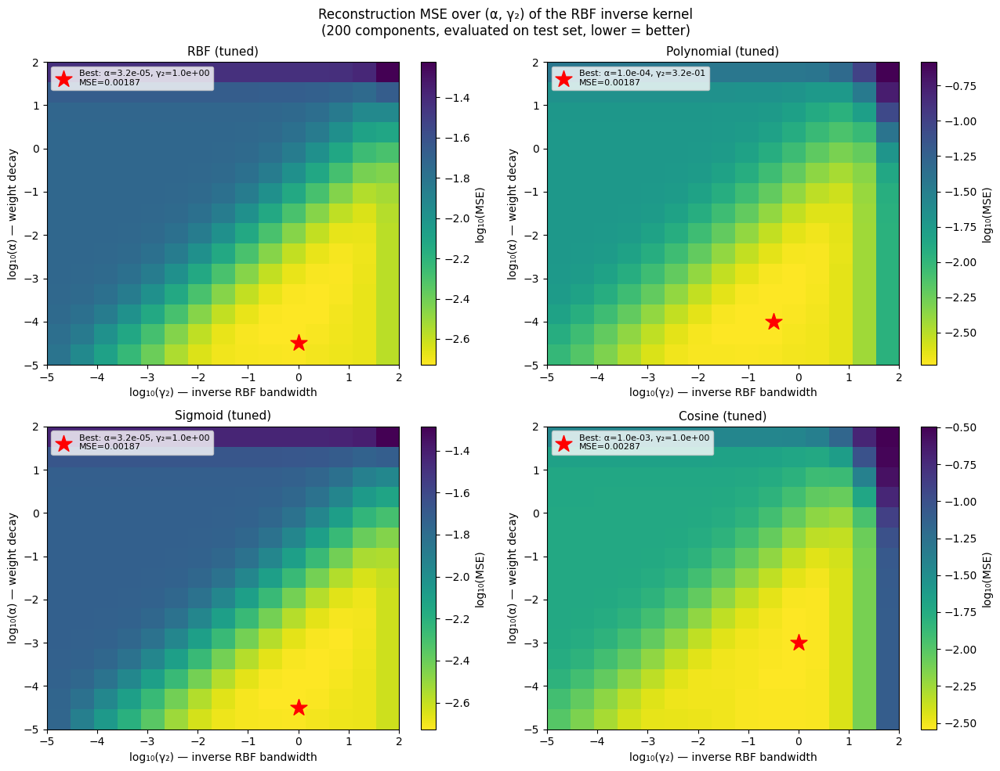

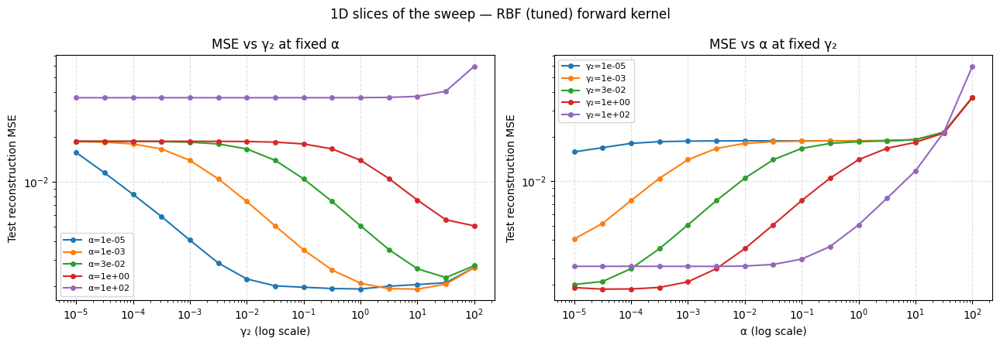

In [24]:
# Heatmaps of test MSE over (alpha, gamma2) — one panel per forward kernel
fig, axes = plt.subplots(2, 2, figsize=(13, 10))

for ax, (label, M) in zip(axes.flat, inv_sweep.items()):
    bi, bj = np.unravel_index(np.argmin(M), M.shape)
    im = ax.imshow(
        np.log10(M), origin='lower', aspect='auto', cmap='viridis_r',
        extent=[np.log10(gamma2_grid[0]), np.log10(gamma2_grid[-1]),
                np.log10(alpha_grid[0]),  np.log10(alpha_grid[-1])]
    )
    ax.scatter(np.log10(gamma2_grid[bj]), np.log10(alpha_grid[bi]),
               marker='*', s=250, color='red', zorder=5,
               label=f'Best: α={alpha_grid[bi]:.1e}, γ₂={gamma2_grid[bj]:.1e}\nMSE={M[bi, bj]:.5f}')
    plt.colorbar(im, ax=ax, label='log₁₀(MSE)')
    ax.set_xlabel('log₁₀(γ₂) — inverse RBF bandwidth')
    ax.set_ylabel('log₁₀(α) — weight decay')
    ax.set_title(label, fontsize=11)
    ax.legend(fontsize=8, loc='upper left')

fig.suptitle('Reconstruction MSE over (α, γ₂) of the RBF inverse kernel\n'
             f'({N_COMPONENTS} components, evaluated on test set, lower = better)', fontsize=12)
plt.tight_layout()
plt.show()

# 1D slices for the RBF forward kernel: each curve fixes one parameter
M_rbf = inv_sweep['RBF (tuned)']
fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))
slice_idx = [0, 4, 7, 10, 14]

for i in slice_idx:
    axes[0].semilogx(gamma2_grid, M_rbf[i], '-o', markersize=4, label=f'α={alpha_grid[i]:.0e}')
axes[0].set_xlabel('γ₂ (log scale)')
axes[0].set_title('MSE vs γ₂ at fixed α')

for j in slice_idx:
    axes[1].semilogx(alpha_grid, M_rbf[:, j], '-o', markersize=4, label=f'γ₂={gamma2_grid[j]:.0e}')
axes[1].set_xlabel('α (log scale)')
axes[1].set_title('MSE vs α at fixed γ₂')

for ax in axes:
    ax.set_ylabel('Test reconstruction MSE')
    ax.set_yscale('log')
    ax.legend(fontsize=8)
    ax.grid(True, linestyle='--', alpha=0.4)

fig.suptitle('1D slices of the sweep — RBF (tuned) forward kernel', fontsize=12)
plt.tight_layout()
plt.show()

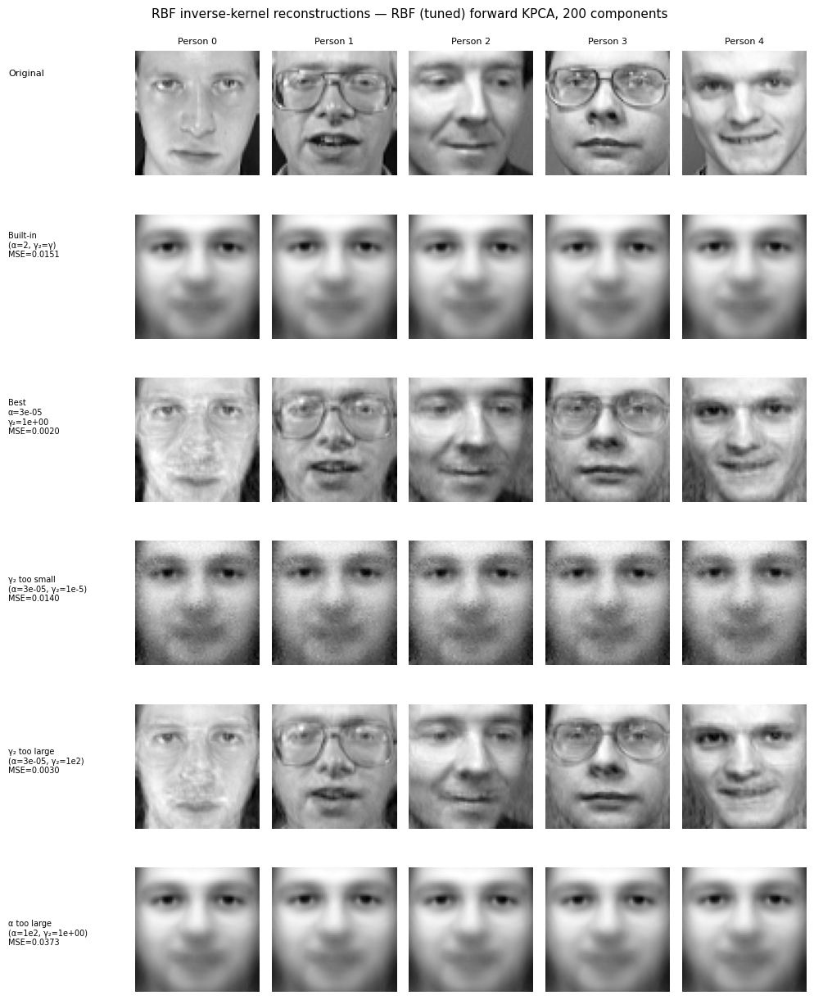

In [25]:
# Visual reconstructions for the RBF forward kernel at characteristic (alpha, gamma2) settings:
# the built-in inverse, the swept optimum, and deliberately bad extremes for contrast.
Z_tr_rbf, _, kpca_rbf = kpca_results['RBF (tuned)']
Z_ex = kpca_rbf.transform(X_examples)
best_alpha, best_gamma2 = inv_best['RBF (tuned)']

display_settings = [
    ('Built-in\n(α=2, γ₂=γ)', None),
    (f'Best\nα={best_alpha:.0e}\nγ₂={best_gamma2:.0e}', (best_alpha, best_gamma2)),
    (f'γ₂ too small\n(α={best_alpha:.0e}, γ₂=1e-5)', (best_alpha, 1e-5)),
    (f'γ₂ too large\n(α={best_alpha:.0e}, γ₂=1e2)', (best_alpha, 1e2)),
    (f'α too large\n(α=1e2, γ₂={best_gamma2:.0e})', (1e2, best_gamma2)),
]

n_rows = 1 + len(display_settings)
fig, axes = plt.subplots(n_rows, N_EXAMPLES, figsize=(N_EXAMPLES * 2, n_rows * 2.1))

for col_idx in range(N_EXAMPLES):
    axes[0, col_idx].imshow(X_examples[col_idx].reshape(64, 64), cmap='gray')
    axes[0, col_idx].set_title(f'Person {y_examples[col_idx]}', fontsize=8)
    axes[0, col_idx].axis('off')
fig.text(0.01, 1 - 0.5 / n_rows, 'Original', fontsize=8, va='center', ha='left')

for row_idx, (name, params) in enumerate(display_settings, start=1):
    if params is None:
        recons = kpca_rbf.inverse_transform(Z_ex)
    else:
        recons = fit_inverse_krr(Z_tr_rbf, *params).predict(Z_ex)
    mse = np.mean((X_examples - recons) ** 2)
    for col_idx in range(N_EXAMPLES):
        img = np.clip(recons[col_idx].reshape(64, 64), 0, 1)
        axes[row_idx, col_idx].imshow(img, cmap='gray')
        axes[row_idx, col_idx].axis('off')
    fig.text(0.01, 1 - (row_idx + 0.5) / n_rows,
             f'{name}\nMSE={mse:.4f}', fontsize=7, va='center', ha='left')

fig.suptitle(f'RBF inverse-kernel reconstructions — RBF (tuned) forward KPCA, {N_COMPONENTS} components',
             fontsize=11)
plt.tight_layout(rect=[0.15, 0, 1, 1])
plt.show()

### Interpreting the sweep

- **The built-in inverse is far from optimal.** It reuses the forward bandwidth (γ ≈ 2.4e-5, chosen for pixel space) in the projected space, where distances are on a completely different scale, and uses a heavy α=2. Tuning (α, γ₂) reduces test MSE by roughly an order of magnitude.
- **γ₂ has an interior optimum around 1** (in Z-space). Too small → the inverse RBF kernel is flat, every test projection looks equally similar to all training points, and the reconstruction collapses towards the mean face. Too large → each test point is only "seen" by its nearest training projections, and the pre-image degenerates towards a nearest-neighbour copy of a training image.
- **α (weight decay) also has an interior optimum** (~3e-5 here). Below it the KRR system becomes ill-conditioned and slightly overfits the training projections; above ~1e-2 the regularisation visibly blurs the reconstructions.
- **The valley is broad and diagonal**: a larger γ₂ tolerates (and benefits from) more weight decay, so the two parameters partially compensate for each other. Any setting inside the valley is close to optimal — the sweep matters mainly for avoiding the bad corners.
- The same optimum appears for all four forward kernels, which makes sense: the inverse map only sees the projected coordinates $Z$, and after KPCA whitening these have similar scales regardless of which forward kernel produced them.

### What to look for

- **Lower MSE** means the reconstruction is closer to the original image — the method has retained more information in its reduced representation
- **Linear PCA** has a well-defined reconstruction because the inverse transform is exact (it is just a matrix multiplication). Its MSE decreases smoothly as components increase
- **Kernel PCA reconstructions** use the approximate inverse transform, so their MSE is not guaranteed to decrease monotonically — but methods that produce a cleaner representation of the data (better aligned with the true manifold) should still show lower MSE
- Comparing the **visual reconstructions** is arguably more informative than the MSE number alone: a reconstruction could have low MSE but still look blurry, while another with slightly higher MSE might preserve identity-relevant features (eyes, nose shape) better
- The gap between linear PCA and the best kernel at small component counts (e.g. 5 or 10) is the most interesting region — it directly shows the benefit of the nonlinear mapping

## 13. Kernel Matrix Visualisation

Because kernel PCA eigenvectors live in an implicit feature space $\mathcal{F}$, they cannot be directly visualised as pixel images. Instead, the most honest and informative visualisation is the **kernel matrix** $K$ itself, where:

$$K_{ij} = k(x_i, x_j)$$

Each entry is the similarity score between two training images as measured by that kernel. Visualising $K$ as a heatmap directly shows what each kernel considers similar or dissimilar, and lets you compare how differently the kernels represent the data.

### What to look for

If the kernel is producing a useful representation for face recognition, you would expect the kernel matrix to show a **block structure** — images of the same person (which appear in contiguous blocks if the data is sorted by identity) should have higher similarity to each other than to images of different people. The clearer this block structure, the more the kernel is capturing identity rather than noise.

We also plot the **eigenvalue spectrum** of each kernel matrix, which shows how much variance each principal component captures. A rapidly decaying spectrum means most information is concentrated in a few components; a flat spectrum means the kernel is not finding much structure.

In [26]:
from sklearn.metrics.pairwise import rbf_kernel, polynomial_kernel, sigmoid_kernel, cosine_similarity

# Sort training data by person label so block structure is visible
sort_idx = np.argsort(y_train)
X_sorted = X_train[sort_idx]

# Compute kernel matrices using the tuned parameters from grid search
rbf_params    = best_params.get('RBF', {})
poly_params   = best_params.get('Polynomial', {})
sig_params    = best_params.get('Sigmoid', {})

K_linear = X_sorted @ X_sorted.T
K_rbf    = rbf_kernel(X_sorted, gamma=rbf_params.get('gamma', 1e-3))
K_poly   = polynomial_kernel(X_sorted,
                              gamma=poly_params.get('gamma', 1e-3),
                              degree=poly_params.get('degree', 3),
                              coef0=poly_params.get('coef0', 0))
K_sigmoid = sigmoid_kernel(X_sorted,
                            gamma=sig_params.get('gamma', 1e-4),
                            coef0=sig_params.get('coef0', 0))
K_cosine  = cosine_similarity(X_sorted)

kernel_matrices = {
    'Linear': K_linear,
    'RBF (tuned)': K_rbf,
    'Polynomial (tuned)': K_poly,
    'Sigmoid (tuned)': K_sigmoid,
    'Cosine': K_cosine,
}

print("Kernel matrices computed. Shapes:")
for name, K in kernel_matrices.items():
    print(f"  {name}: {K.shape}")

Kernel matrices computed. Shapes:
  Linear: (320, 320)
  RBF (tuned): (320, 320)
  Polynomial (tuned): (320, 320)
  Sigmoid (tuned): (320, 320)
  Cosine: (320, 320)


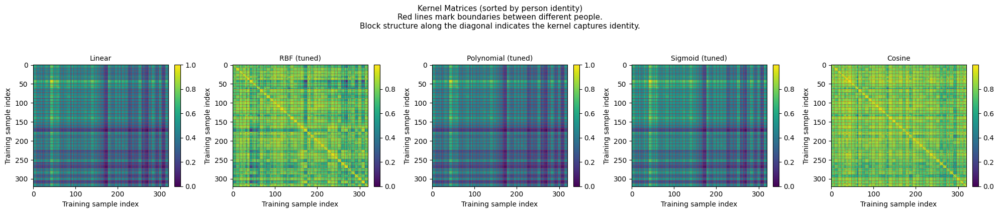

In [27]:
# Plot kernel matrix heatmaps
fig, axes = plt.subplots(1, 5, figsize=(20, 4))

for ax, (name, K) in zip(axes, kernel_matrices.items()):
    # Normalise to [0,1] for consistent colour scale
    K_norm = (K - K.min()) / (K.max() - K.min() + 1e-8)
    im = ax.imshow(K_norm, cmap='viridis', aspect='auto')
    ax.set_title(name, fontsize=10)
    ax.set_xlabel('Training sample index')
    ax.set_ylabel('Training sample index')
    # Mark person boundaries with lines
    n_per_person = int(X_sorted.shape[0] / 40)
    for boundary in range(n_per_person, X_sorted.shape[0], n_per_person):
        ax.axhline(boundary - 0.5, color='red', linewidth=0.4, alpha=0.5)
        ax.axvline(boundary - 0.5, color='red', linewidth=0.4, alpha=0.5)
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

fig.suptitle('Kernel Matrices (sorted by person identity)\n'
             'Red lines mark boundaries between different people.\n'
             'Block structure along the diagonal indicates the kernel captures identity.',
             fontsize=11, y=1.05)
plt.tight_layout()
plt.show()

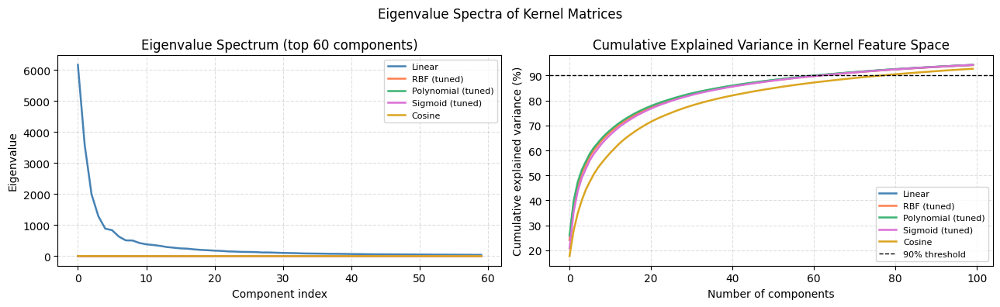

In [28]:
# Plot the eigenvalue spectrum of each kernel matrix
# This shows how concentrated the variance is across components

fig, axes = plt.subplots(1, 2, figsize=(13, 4))

colours = ['steelblue', 'coral', 'mediumseagreen', 'orchid', 'goldenrod']

for (name, K), col in zip(kernel_matrices.items(), colours):
    # Centre the kernel matrix (as Kernel PCA does internally)
    n = K.shape[0]
    one_n = np.ones((n, n)) / n
    K_centred = K - one_n @ K - K @ one_n + one_n @ K @ one_n
    eigvals = np.linalg.eigvalsh(K_centred)
    eigvals = np.sort(eigvals)[::-1]
    eigvals = np.maximum(eigvals, 0)   # numerical noise can give tiny negatives

    # Absolute spectrum (first 60 components)
    axes[0].plot(eigvals[:60], color=col, label=name, linewidth=1.8)

    # Cumulative explained variance
    cumvar = np.cumsum(eigvals) / (np.sum(eigvals) + 1e-10) * 100
    axes[1].plot(cumvar[:100], color=col, label=name, linewidth=1.8)

axes[0].set_xlabel('Component index')
axes[0].set_ylabel('Eigenvalue')
axes[0].set_title('Eigenvalue Spectrum (top 60 components)')
axes[0].legend(fontsize=8)
axes[0].grid(True, linestyle='--', alpha=0.4)

axes[1].set_xlabel('Number of components')
axes[1].set_ylabel('Cumulative explained variance (%)')
axes[1].set_title('Cumulative Explained Variance in Kernel Feature Space')
axes[1].axhline(90, color='black', linestyle='--', linewidth=1, label='90% threshold')
axes[1].legend(fontsize=8)
axes[1].grid(True, linestyle='--', alpha=0.4)

plt.suptitle('Eigenvalue Spectra of Kernel Matrices', fontsize=12)
plt.tight_layout()
plt.show()

In [29]:
#kNN classifier without PCA (performed directly on raw 4096-dimension data)
knn_raw = KNeighborsClassifier(n_neighbors=K_NEIGHBOURS)
knn_raw.fit(X_train, y_train)
acc_raw = knn_raw.score(X_test, y_test) * 100
print(f"kNN on raw data (no PCA): {acc_raw:.1f}%")

kNN on raw data (no PCA): 82.5%


### Interpreting the results

**Kernel matrix heatmaps:** A kernel that is useful for face recognition should show bright blocks along the diagonal (high within-person similarity) and darker off-diagonal regions (low between-person similarity). The red lines mark the boundaries between different people's images. If the block structure is clear, the kernel is doing a good job of grouping same-person images together before any classification happens.

**Eigenvalue spectra:** A steeply decaying spectrum means the kernel has found a low-dimensional structure in the data — most variance is concentrated in the first few components. A flatter spectrum means the kernel sees the data as more uniformly spread across many dimensions. Kernels with steeper decay tend to need fewer components to reach good classification accuracy, which is consistent with what you observe in the accuracy vs components plot.

**Why this is more honest than pre-image reconstruction:** The kernel matrix is a quantity that Kernel PCA actually computes — it is not an approximation. Visualising it directly shows you what each kernel is doing without any reconstruction error.